In [1]:
import matplotlib.pyplot as plt
from matplotlib.backend_bases import RendererBase
from scipy import signal
from scipy.io import wavfile
#import soundfile as sf
import os
import numpy as np
from PIL import Image
from scipy.fftpack import fft

%matplotlib inline

In [25]:
audio_path = './test_train_data/'
pict_Path = './test_pic_train/'
test_pict_Path = './test_pic_test/'
test_audio_path = './test_val_data/'
samples = []

In [26]:
if not os.path.exists(pict_Path):
    os.makedirs(pict_Path)

if not os.path.exists(test_pict_Path):
    os.makedirs(test_pict_Path)


subFolderList = []
for x in os.listdir(audio_path):
    if os.path.isdir(audio_path + '/' + x):
        subFolderList.append(x)
        if not os.path.exists(pict_Path + '/' + x):
            os.makedirs(pict_Path +'/'+ x)
subFolderList.sort()

In [27]:
sample_audio = []
total = 0
for x in subFolderList:
    
    # get all the wave files
    all_files = [y for y in os.listdir(audio_path + x) if '.wav' in y]
    all_files.sort()
#     print(all_files)
    total += len(all_files)
    # collect the first file from each dir
    sample_audio.append(audio_path  + x + '/'+ all_files[0])
    
    # show file counts
#     print('count: %d : %s' % (len(all_files), x ))
print(total//5)

121


In [28]:
def log_specgram(audio, sample_rate, window_size=20,
                 step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))
#     print(audio, noverlap)
    freqs, _, spec = signal.spectrogram(audio,
                                    fs=sample_rate,
                                    window='hann',
                                    nperseg=nperseg,
                                    noverlap=noverlap,
                                    detrend=False)
    return freqs, np.log(spec.T.astype(np.float32) + eps)

./test_train_data/2017019740001_kwakjuheon/0.wav
2017019740001_kwakjuheon ,  8000
./test_train_data/2017019740002_kimjiho/1.wav
2017019740002_kimjiho ,  48000
./test_train_data/2017019740003_songyejin/1.wav
2017019740003_songyejin ,  16000
./test_train_data/2017019740004_parksohui/1.wav
2017019740004_parksohui ,  48000
./test_train_data/2017019740005_moonyeonwoo/1.wav
2017019740005_moonyeonwoo ,  48000
./test_train_data/2017019740006_kangsubin/1.wav
2017019740006_kangsubin ,  44100
./test_train_data/2017019740007_leekyeongeun/1.wav
2017019740007_leekyeongeun ,  48000
./test_train_data/2017019740008_chochaeyeon/1.wav
2017019740008_chochaeyeon ,  48000
./test_train_data/2017019740009_shindonghwan/1.wav
2017019740009_shindonghwan ,  8000
./test_train_data/2017019740010_kwakmirae/1.wav
2017019740010_kwakmirae ,  48000
./test_train_data/2017019740011_kimhyeryeong/1.wav
2017019740011_kimhyeryeong ,  8000
./test_train_data/2017019740012_chaeminjoon/1.wav
2017019740012_chaeminjoon ,  48000
./t

./test_train_data/2017019880022_kimjaein/1.wav
2017019880022_kimjaein ,  48000
./test_train_data/2017019880023_yoohaekyung/1.wav
2017019880023_yoohaekyung ,  48000
./test_train_data/2017019880026_parkjongsang/1.wav
2017019880026_parkjongsang ,  8000
./test_train_data/2017019880027_leesol/1.wav
2017019880027_leesol ,  44100
./test_train_data/2017019880028_kimsunghan/1.wav
2017019880028_kimsunghan ,  16000
./test_train_data/2017019880029_kimminji/1.wav
2017019880029_kimminji ,  44100
./test_train_data/2017019880030_hanseungoh/1.wav
2017019880030_hanseungoh ,  48000
./test_train_data/2017019880031_ahnjiwoo/1.wav
2017019880031_ahnjiwoo ,  48000
./test_train_data/2017019880033_kimnoeun/1.wav
2017019880033_kimnoeun ,  48000
./test_train_data/2017019880034_leesujung/1.wav
2017019880034_leesujung ,  44100
./test_train_data/2017019880035_songhyunjin/1.wav
2017019880035_songhyunjin ,  48000
./test_train_data/2017019880036_kimjihye/1.wav
2017019880036_kimjihye ,  44100
./test_train_data/201701988

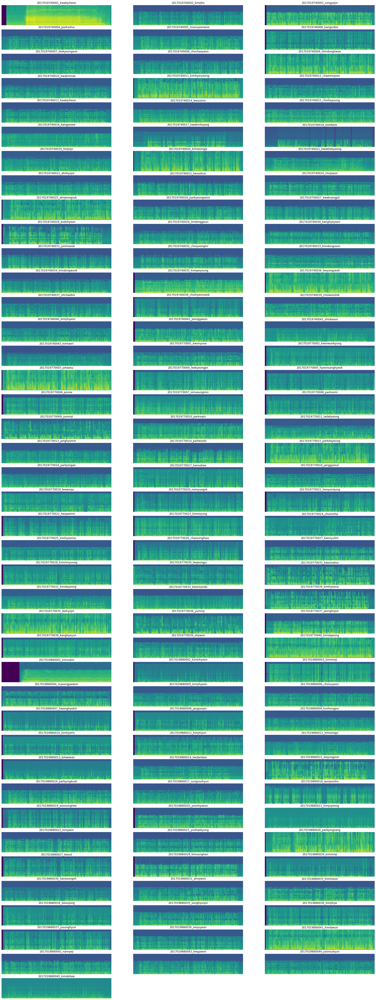

In [29]:
fig = plt.figure(figsize=(30,100))

# for each of the samples
for i, filepath in enumerate(sample_audio):
    # Make subplots
    plt.subplot(50,3,i+1)
    print(filepath)
    # pull the labels
    label = filepath.split('/')[-2]
    plt.title(label)
    
    # create spectogram
    samplerate, test_sound  = wavfile.read(filepath)
    print(label, ", ", samplerate)
    _, spectrogram = log_specgram(test_sound, samplerate)
    
    plt.imshow(spectrogram.T, aspect='auto', origin='lower')
    plt.axis('off')



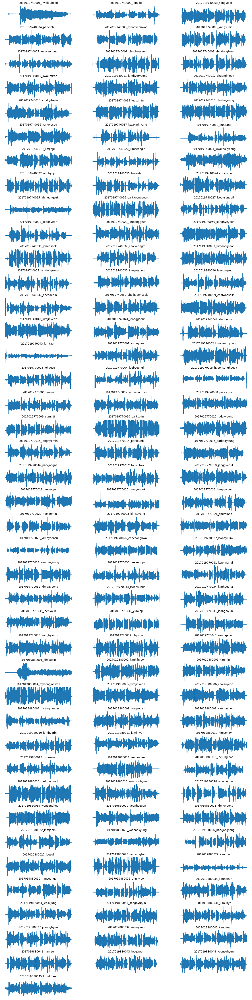

In [16]:
fig = plt.figure(figsize=(20,100))
for i, filepath in enumerate(sample_audio):
    plt.subplot(50,3,i+1)
    samplerate, test_sound  = wavfile.read(filepath)
    plt.title(filepath.split('/')[-2])
    plt.axis('off')
    plt.plot(test_sound)

201701988_Holism.wav
201701988_OtherWord.wav
201701974_Airpods.wav
201701974_Holism.wav
201701988_Airpods.wav
201701988_Holism2.wav
201701988_EarPhone.wav
['201701974_Airpods.wav', '201701974_Holism.wav', '201701988_Airpods.wav', '201701988_EarPhone.wav', '201701988_Holism.wav', '201701988_Holism2.wav', '201701988_OtherWord.wav']
0
./test_spectogram/201701974_Airpods.wav ,  16000
./test_spectogram/201701974_Holism.wav ,  16000
./test_spectogram/201701988_Airpods.wav ,  44100
./test_spectogram/201701988_EarPhone.wav ,  44100
./test_spectogram/201701988_Holism.wav ,  44100
./test_spectogram/201701988_Holism2.wav ,  44100
./test_spectogram/201701988_OtherWord.wav ,  44100


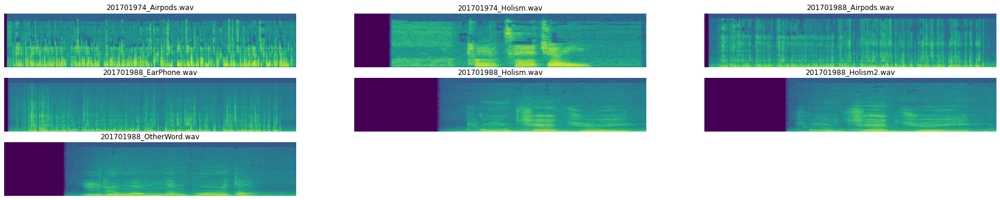

In [40]:
audio_path = './test_spectogram/'
pict_Path = './test_pic_spec_train/'
test_pict_Path = './test_pic_spec_test/'
# test_audio_path = './test_val_data/'

subFolderList = []
for x in os.listdir(audio_path):
    print(x)
    subFolderList.append(x)
subFolderList.sort()
print(subFolderList)

sample_audio = []
total = 0
for x in subFolderList:
    
    sample_audio.append(x)
print(total//5)

fig = plt.figure(figsize=(30,100))


for i, filepath in enumerate(sample_audio):

    plt.subplot(50,3,i+1)
    plt.title(filepath)
    
    new_path = audio_path + filepath
    samplerate, test_sound  = wavfile.read(new_path)
    print(new_path, ", ", samplerate)
    _, spectrogram = log_specgram(test_sound, samplerate)
    
    plt.imshow(spectrogram.T, aspect='auto', origin='lower')
    plt.axis('off')


In [39]:
def wav2img(wav_path, targetdir='', figsize=(4,4)):
    """
    takes in wave file path
    and the fig size. Default 4,4 will make images 288 x 288
    """

    fig = plt.figure(figsize=figsize)    
    # use soundfile library to read in the wave files
    samplerate, test_sound  = wavfile.read(filepath)
    _, spectrogram = log_specgram(test_sound, samplerate)
    
    ## create output path
    output_file = wav_path.split('/')[-1].split('.wav')[0]
    output_file = targetdir +'/'+ output_file
    #plt.imshow(spectrogram.T, aspect='auto', origin='lower')
    plt.imsave('%s.png' % output_file, spectrogram)
    plt.close()


In [40]:
def wav2img_waveform(wav_path, targetdir='', figsize=(4,4)):
    samplerate,test_sound  = wavfile.read(sample_audio[0])
    fig = plt.figure(figsize=figsize)
    plt.plot(test_sound)
    plt.axis('off')
    output_file = wav_path.split('/')[-1].split('.wav')[0]
    output_file = targetdir +'/'+ output_file
    plt.savefig('%s.png' % output_file)
    plt.close()


In [43]:
for i, x in enumerate(subFolderList[:9]):
    print(i, ':', x)
    # get all the wave files
    all_files = [y for y in os.listdir(audio_path + x) if '.wav' in y]
    for file in all_files[:10]:
        wav2img(audio_path + x + '/' + file, pict_Path + x)


0 : 2017019740001_kwakjuheon
1 : 2017019740002_kimjiho
2 : 2017019740003_songyejin
3 : 2017019740004_parksohui
4 : 2017019740005_moonyeonwoo
5 : 2017019740006_kangsubin
6 : 2017019740007_leekyeongeun
7 : 2017019740008_chochaeyeon
8 : 2017019740009_shindonghwan
